In [1]:
import sys
print("Python executable:", sys.executable)

import tensorflow as tf
print("TensorFlow version:", tf.__version__)

import cv2
print("OpenCV version:", cv2.__version__)

import matplotlib
print("Matplotlib version:", matplotlib.__version__)


Python executable: c:\Users\Lenovo\Downloads\ObjectDetectionAI\venv\Scripts\python.exe
TensorFlow version: 2.20.0
OpenCV version: 4.12.0
Matplotlib version: 3.10.6


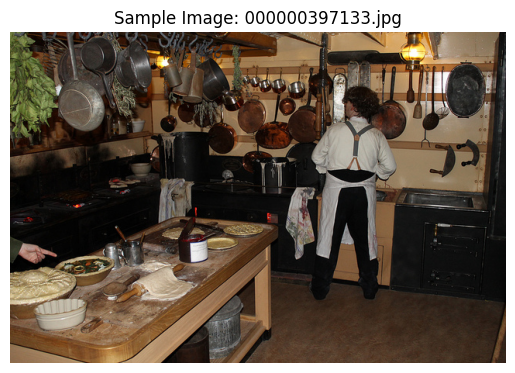

In [1]:
# Step 1: Import libraries
import os
import json
import cv2
import matplotlib.pyplot as plt

# Step 2: Set paths
images_path = "images/val2017/val2017"            # include the inner folder
annotations_path = "annotations/stuff_val2017.json"  # COCO annotations file

# Step 3: Load annotations
with open(annotations_path) as f:
    coco_annotations = json.load(f)



# Step 4: Pick a sample image
sample_image_info = coco_annotations['images'][0]  # first image info from JSON
sample_image_file = sample_image_info['file_name']
sample_image_path = os.path.join(images_path, sample_image_file)

# Step 5: Load image
if os.path.exists(sample_image_path):
    img = cv2.imread(sample_image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # convert BGR to RGB for matplotlib

    # Step 6: Display image
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Sample Image: {sample_image_file}")
    plt.show()
else:
    print(f"Image not found: {sample_image_path}")


{92: 'banner', 93: 'blanket', 94: 'branch', 95: 'bridge', 96: 'building-other', 97: 'bush', 98: 'cabinet', 99: 'cage', 100: 'cardboard', 101: 'carpet', 102: 'ceiling-other', 103: 'ceiling-tile', 104: 'cloth', 105: 'clothes', 106: 'clouds', 107: 'counter', 108: 'cupboard', 109: 'curtain', 110: 'desk-stuff', 111: 'dirt', 112: 'door-stuff', 113: 'fence', 114: 'floor-marble', 115: 'floor-other', 116: 'floor-stone', 117: 'floor-tile', 118: 'floor-wood', 119: 'flower', 120: 'fog', 121: 'food-other', 122: 'fruit', 123: 'furniture-other', 124: 'grass', 125: 'gravel', 126: 'ground-other', 127: 'hill', 128: 'house', 129: 'leaves', 130: 'light', 131: 'mat', 132: 'metal', 133: 'mirror-stuff', 134: 'moss', 135: 'mountain', 136: 'mud', 137: 'napkin', 138: 'net', 139: 'paper', 140: 'pavement', 141: 'pillow', 142: 'plant-other', 143: 'plastic', 144: 'platform', 145: 'playingfield', 146: 'railing', 147: 'railroad', 148: 'river', 149: 'road', 150: 'rock', 151: 'roof', 152: 'rug', 153: 'salad', 154: 'san

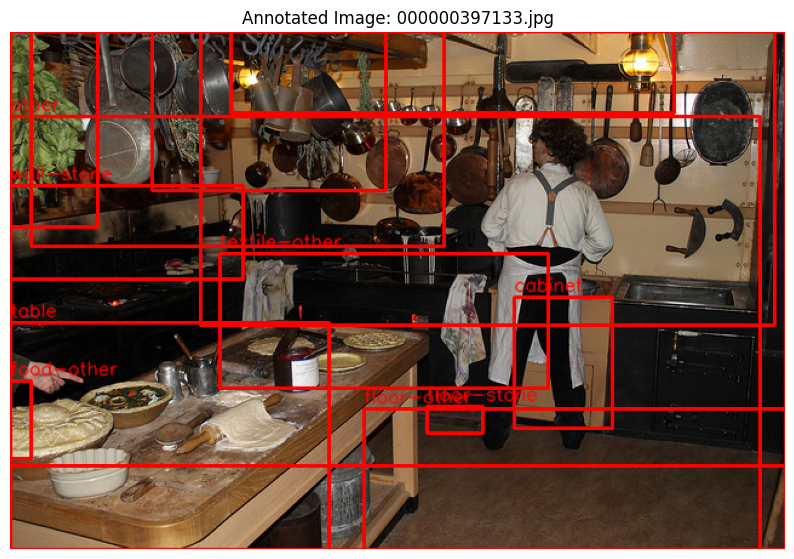

Object: branch, BBox: [x=117, y=0, w=193, h=131], Area: 5184.0
Object: cabinet, BBox: [x=416, y=219, w=81, h=108], Area: 3280.0
Object: floor-other, BBox: [x=292, y=311, w=348, h=116], Area: 28614.0
Object: floor-stone, BBox: [x=344, y=309, w=46, h=22], Area: 691.0
Object: food-other, BBox: [x=0, y=288, w=17, h=64], Area: 196.0
Object: furniture-other, BBox: [x=17, y=0, w=341, h=177], Area: 5583.0
Object: leaves, BBox: [x=0, y=0, w=72, h=161], Area: 7793.0
Object: light, BBox: [x=182, y=0, w=366, h=67], Area: 2603.0
Object: metal, BBox: [x=0, y=0, w=640, h=358], Area: 70572.0
Object: table, BBox: [x=0, y=240, w=263, h=187], Area: 256.0
Object: textile-other, BBox: [x=173, y=183, w=271, h=111], Area: 4800.0
Object: wall-other, BBox: [x=157, y=0, w=474, h=242], Area: 43041.0
Object: wall-stone, BBox: [x=0, y=127, w=192, h=77], Area: 5490.0
Object: other, BBox: [x=0, y=70, w=619, h=357], Area: 91698.0


In [3]:
# Step 1: Build a category dictionary
categories = {cat['id']: cat['name'] for cat in coco_annotations['categories']}
print(categories)

# Step 2: Pick a sample image
sample_image_info = coco_annotations['images'][0]  # first image info
sample_image_file = sample_image_info['file_name']
sample_image_path = os.path.join(images_path, sample_image_file)

# Step 3: Load image
img = cv2.imread(sample_image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Step 4: Get annotations for this image
image_id = sample_image_info['id']
image_annotations = [ann for ann in coco_annotations['annotations'] if ann['image_id'] == image_id]

# Step 5: Draw bounding boxes and labels
for ann in image_annotations:
    x, y, w, h = map(int, ann['bbox'])  # bounding box
    category_name = categories[ann['category_id']]
    
    # Draw rectangle
    cv2.rectangle(img, (x, y), (x + w, y + h), color=(255, 0, 0), thickness=2)
    
    # Put label
    cv2.putText(img, category_name, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 
                0.5, (255, 0, 0), 1, cv2.LINE_AA)

# Step 6: Show image
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')
plt.title(f"Annotated Image: {sample_image_file}")
plt.show()

# Loop over each annotation for the sample image
for ann in image_annotations:
    # Get object name
    category_name = categories[ann['category_id']]
    
    # Get bounding box
    x, y, w, h = map(int, ann['bbox'])
    
    # Get area
    area = ann['area']
    
    # Print in plain English
    print(f"Object: {category_name}, BBox: [x={x}, y={y}, w={w}, h={h}], Area: {area}")



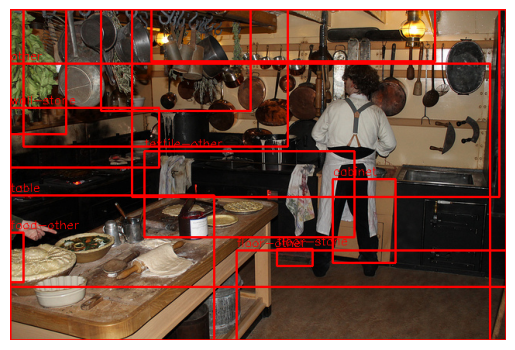

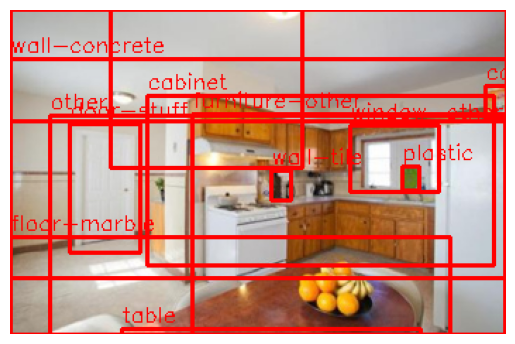

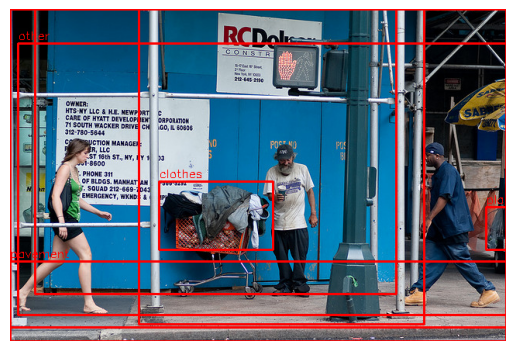

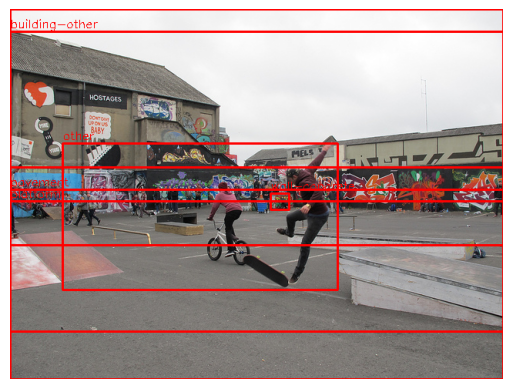

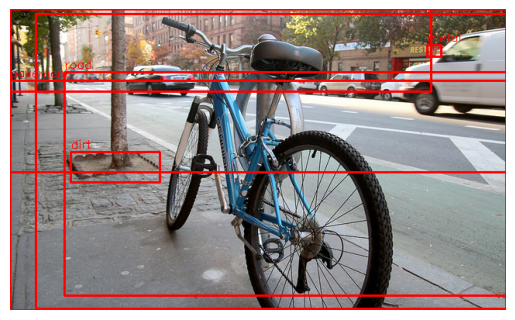

In [4]:
for sample_image_info in coco_annotations['images'][:5]:  # first 5 images
    sample_image_file = sample_image_info['file_name']
    sample_image_path = os.path.join(images_path, sample_image_file)
    img = cv2.imread(sample_image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    image_id = sample_image_info['id']
    image_annotations = [ann for ann in coco_annotations['annotations'] if ann['image_id'] == image_id]
    
    for ann in image_annotations:
        x, y, w, h = map(int, ann['bbox'])
        category_name = categories[ann['category_id']]
        cv2.rectangle(img, (x, y), (x+w, y+h), (255,0,0), 2)
        cv2.putText(img, category_name, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 1)
    
    plt.imshow(img)
    plt.axis('off')
    plt.show()


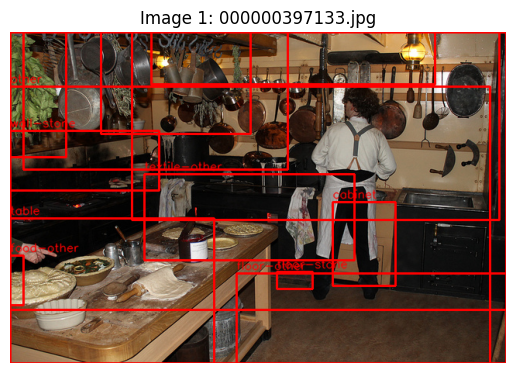

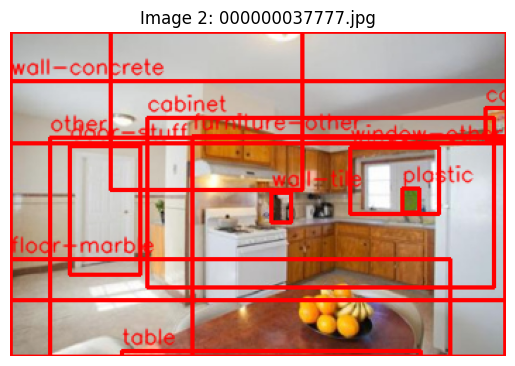

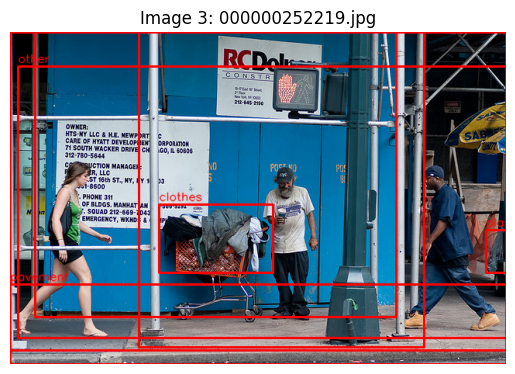

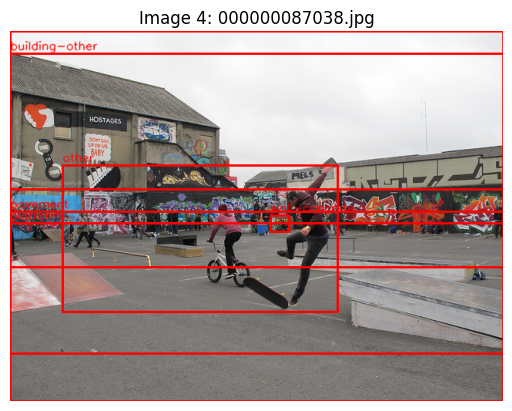

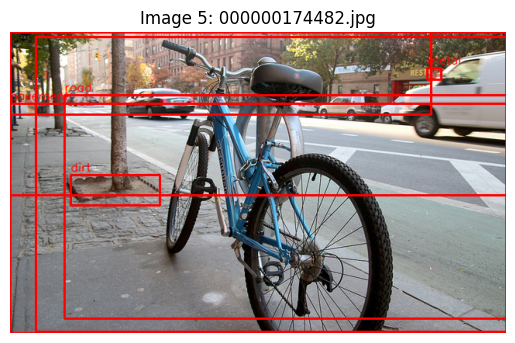

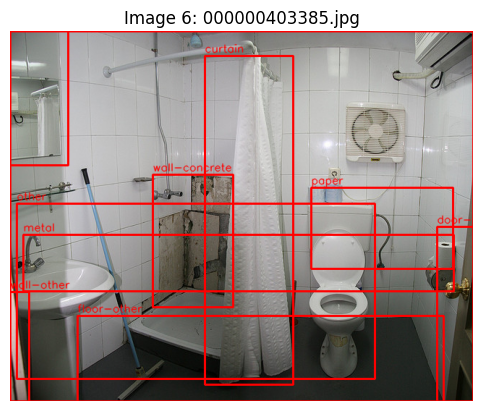

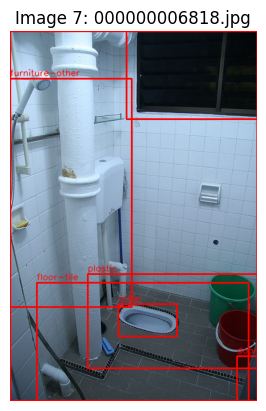

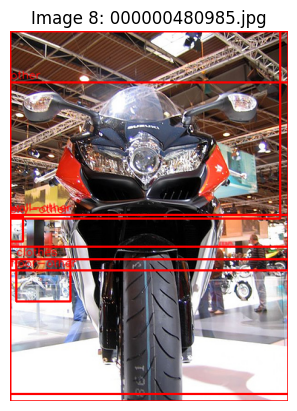

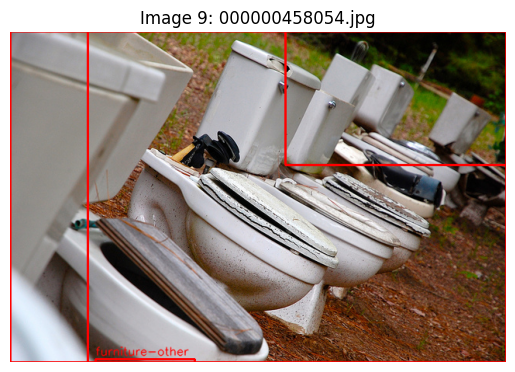

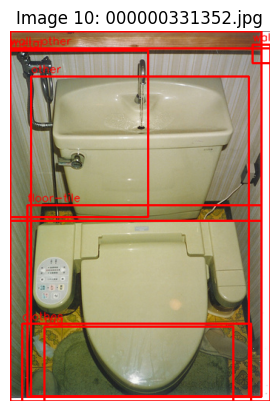

In [5]:
for i, img_info in enumerate(coco_annotations['images'][:10]):  # first 10 images
    img_file = img_info['file_name']
    img_path = os.path.join(images_path, img_file)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    image_id = img_info['id']
    image_annotations = [ann for ann in coco_annotations['annotations'] if ann['image_id'] == image_id]

    for ann in image_annotations:
        x, y, w, h = map(int, ann['bbox'])
        category_name = categories[ann['category_id']]
        cv2.rectangle(img, (x, y), (x + w, y + h), color=(255, 0, 0), thickness=2)
        cv2.putText(img, category_name, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX,
                    0.5, (255, 0, 0), 1, cv2.LINE_AA)
    
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Image {i+1}: {img_file}")
    plt.show()



image 1/1 c:\Users\Lenovo\Downloads\ObjectDetectionAI\images\val2017\val2017\000000000139.jpg: 448x640 1 person, 5 chairs, 1 potted plant, 3 dining tables, 1 tv, 1 refrigerator, 2 clocks, 1 vase, 97.3ms
Speed: 2.4ms preprocess, 97.3ms inference, 3.8ms postprocess per image at shape (1, 3, 448, 640)


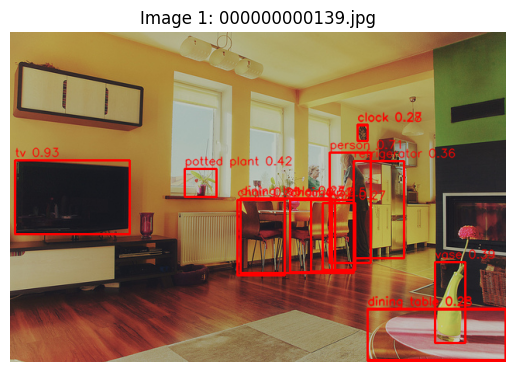


image 1/1 c:\Users\Lenovo\Downloads\ObjectDetectionAI\images\val2017\val2017\000000000285.jpg: 640x608 1 bear, 99.1ms
Speed: 2.8ms preprocess, 99.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 608)


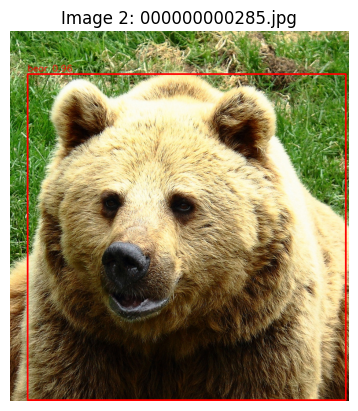


image 1/1 c:\Users\Lenovo\Downloads\ObjectDetectionAI\images\val2017\val2017\000000000632.jpg: 512x640 1 bottle, 1 chair, 2 potted plants, 1 bed, 2 books, 87.2ms
Speed: 1.8ms preprocess, 87.2ms inference, 2.4ms postprocess per image at shape (1, 3, 512, 640)


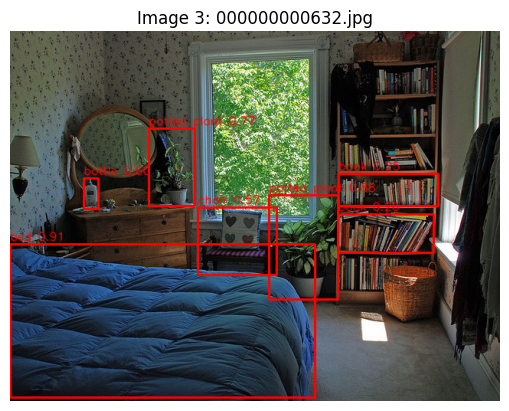


image 1/1 c:\Users\Lenovo\Downloads\ObjectDetectionAI\images\val2017\val2017\000000000724.jpg: 640x480 1 truck, 2 stop signs, 91.4ms
Speed: 2.3ms preprocess, 91.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


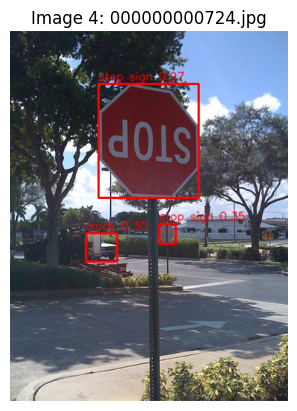


image 1/1 c:\Users\Lenovo\Downloads\ObjectDetectionAI\images\val2017\val2017\000000000776.jpg: 640x448 4 teddy bears, 82.0ms
Speed: 1.5ms preprocess, 82.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 448)


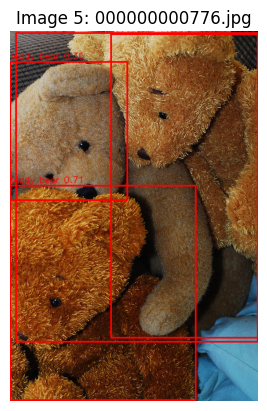


image 1/1 c:\Users\Lenovo\Downloads\ObjectDetectionAI\images\val2017\val2017\000000000785.jpg: 448x640 1 person, 1 skis, 64.7ms
Speed: 1.5ms preprocess, 64.7ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


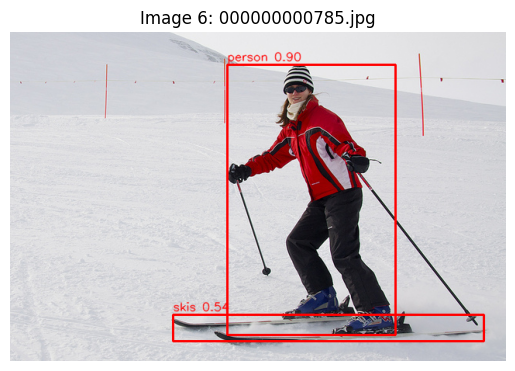


image 1/1 c:\Users\Lenovo\Downloads\ObjectDetectionAI\images\val2017\val2017\000000000802.jpg: 640x448 1 oven, 1 refrigerator, 62.1ms
Speed: 1.7ms preprocess, 62.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 448)


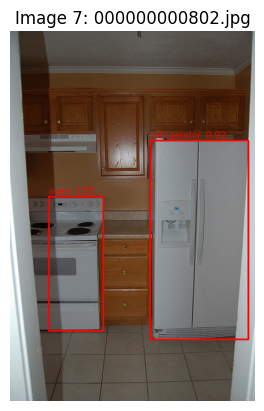


image 1/1 c:\Users\Lenovo\Downloads\ObjectDetectionAI\images\val2017\val2017\000000000872.jpg: 640x640 2 persons, 105.3ms
Speed: 3.7ms preprocess, 105.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


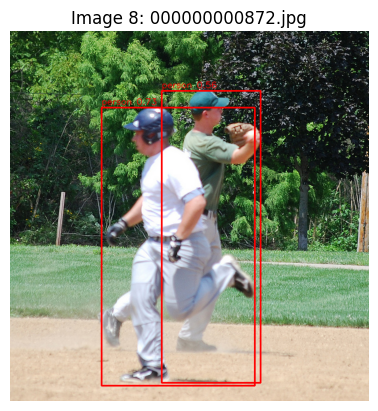


image 1/1 c:\Users\Lenovo\Downloads\ObjectDetectionAI\images\val2017\val2017\000000000885.jpg: 448x640 4 persons, 1 tennis racket, 63.2ms
Speed: 1.8ms preprocess, 63.2ms inference, 2.2ms postprocess per image at shape (1, 3, 448, 640)


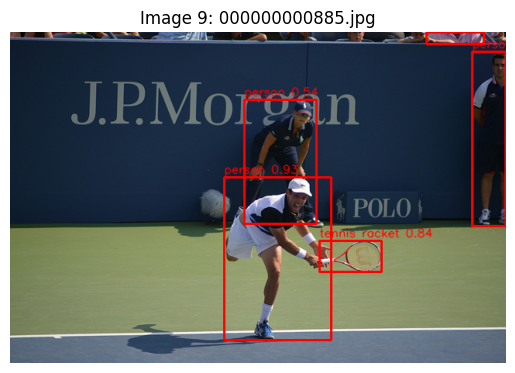


image 1/1 c:\Users\Lenovo\Downloads\ObjectDetectionAI\images\val2017\val2017\000000001000.jpg: 480x640 13 persons, 2 tennis rackets, 82.7ms
Speed: 1.6ms preprocess, 82.7ms inference, 3.8ms postprocess per image at shape (1, 3, 480, 640)


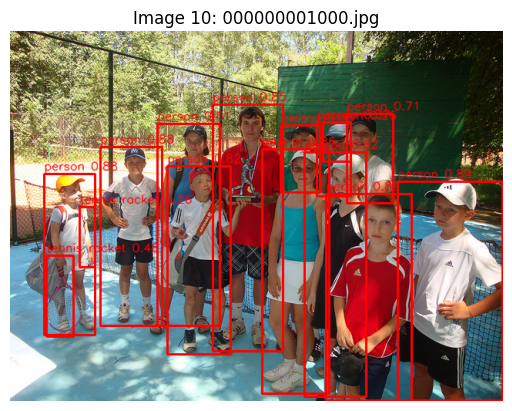

In [6]:
# Step 1: Import libraries
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import os

# Step 2: Set image folder path
images_path = "images/val2017/val2017"  # adjust if needed

# Step 3: Load pre-trained YOLOv8 model
model = YOLO("yolov8n.pt")  # yolov8n = nano model (fast, small)

# Step 4: Loop over first 10 images
image_files = os.listdir(images_path)[:10]

for i, img_file in enumerate(image_files):
    img_path = os.path.join(images_path, img_file)
    
    # Run YOLO inference
    results = model(img_path)[0]  # get first batch results
    
    # Convert image to RGB for matplotlib
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Draw bounding boxes and labels
    for box, cls, conf in zip(results.boxes.xyxy, results.boxes.cls, results.boxes.conf):
        x1, y1, x2, y2 = map(int, box)
        label = f"{model.names[int(cls)]} {conf:.2f}"
        cv2.rectangle(img, (x1, y1), (x2, y2), color=(255,0,0), thickness=2)
        cv2.putText(img, label, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 1, cv2.LINE_AA)
    
    # Display the image
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Image {i+1}: {img_file}")
    plt.show()


In [7]:
# Step 1: Import libraries
from ultralytics import YOLO
import cv2
import os
import csv

# Step 2: Paths
images_path = "images/val2017/val2017"        # folder with your val images
output_path = "predictions"                    # folder to save predicted images
os.makedirs(output_path, exist_ok=True)       # create folder if it doesn't exist
csv_file = "predictions_log.csv"               # CSV to save detections

# Step 3: Load YOLOv8 model
model = YOLO("yolov8n.pt")  # pre-trained YOLOv8 nano model

# Step 4: Prepare CSV file
with open(csv_file, mode='w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(["image_file", "class_name", "confidence", "x1", "y1", "x2", "y2"])  # header

# Step 5: Run detection on all images
image_files = os.listdir(images_path)

for img_file in image_files:
    img_path = os.path.join(images_path, img_file)
    
    # Run YOLO inference
    results = model(img_path)[0]
    
    # Read image to draw bounding boxes
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Draw bounding boxes and save detections to CSV
    for box, cls, conf in zip(results.boxes.xyxy, results.boxes.cls, results.boxes.conf):
        x1, y1, x2, y2 = map(int, box)
        label = model.names[int(cls)]
        
        # Draw rectangle and label
        cv2.rectangle(img, (x1, y1), (x2, y2), color=(255,0,0), thickness=2)
        cv2.putText(img, f"{label} {conf:.2f}", (x1, y1-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 1, cv2.LINE_AA)
        
        # Write detection to CSV
        with open(csv_file, mode='a', newline='') as f:
            writer = csv.writer(f)
            writer.writerow([img_file, label, float(conf), x1, y1, x2, y2])
    
    # Save predicted image
    save_path = os.path.join(output_path, img_file)
    cv2.imwrite(save_path, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

print(f"All predictions saved to {output_path}")
print(f"Detections logged in {csv_file}")



image 1/1 c:\Users\Lenovo\Downloads\ObjectDetectionAI\images\val2017\val2017\000000000139.jpg: 448x640 1 person, 5 chairs, 1 potted plant, 3 dining tables, 1 tv, 1 refrigerator, 2 clocks, 1 vase, 66.2ms
Speed: 1.5ms preprocess, 66.2ms inference, 2.7ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 c:\Users\Lenovo\Downloads\ObjectDetectionAI\images\val2017\val2017\000000000285.jpg: 640x608 1 bear, 81.2ms
Speed: 2.7ms preprocess, 81.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 608)

image 1/1 c:\Users\Lenovo\Downloads\ObjectDetectionAI\images\val2017\val2017\000000000632.jpg: 512x640 1 bottle, 1 chair, 2 potted plants, 1 bed, 2 books, 75.1ms
Speed: 1.8ms preprocess, 75.1ms inference, 2.3ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 c:\Users\Lenovo\Downloads\ObjectDetectionAI\images\val2017\val2017\000000000724.jpg: 640x480 1 truck, 2 stop signs, 68.1ms
Speed: 2.4ms preprocess, 68.1ms inference, 1.7ms postprocess per image at shape (1, 3, 64

In [8]:
from ultralytics import YOLO
import cv2
import csv
import os
from datetime import datetime

# Step 1: Load YOLOv8 model
model = YOLO("yolov8n.pt")  # pre-trained YOLOv8 nano model

# Step 2: Prepare CSV file
csv_file = "webcam_detections.csv"
if not os.path.exists(csv_file):
    with open(csv_file, mode='w', newline='') as f:
        writer = csv.writer(f)
        writer.writerow(["timestamp", "class_name", "confidence", "x1", "y1", "x2", "y2"])  # header

# Step 3: Open webcam (0 = default)
cap = cv2.VideoCapture(0)

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Step 4: Run YOLO inference
    results = model(frame)[0]

    # Step 5: Draw bounding boxes and labels, save to CSV
    timestamp = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    for box, cls, conf in zip(results.boxes.xyxy, results.boxes.cls, results.boxes.conf):
        x1, y1, x2, y2 = map(int, box)
        label = model.names[int(cls)]
        cv2.rectangle(frame, (x1, y1), (x2, y2), color=(255,0,0), thickness=2)
        cv2.putText(frame, f"{label} {conf:.2f}", (x1, y1-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 1, cv2.LINE_AA)

        # Append detection to CSV
        with open(csv_file, mode='a', newline='') as f:
            writer = csv.writer(f)
            writer.writerow([timestamp, label, float(conf), x1, y1, x2, y2])

    # Step 6: Show webcam feed
    cv2.imshow("YOLOv8 Webcam Detection", frame)

    # Step 7: Exit on pressing 'q'
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()
print(f"All detections logged in {csv_file}")


0: 480x640 1 person, 94.0ms
Speed: 3.1ms preprocess, 94.0ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 73.7ms
Speed: 2.1ms preprocess, 73.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 65.4ms
Speed: 2.1ms preprocess, 65.4ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 62.9ms
Speed: 2.0ms preprocess, 62.9ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 63.6ms
Speed: 1.5ms preprocess, 63.6ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 76.1ms
Speed: 1.7ms preprocess, 76.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 67.0ms
Speed: 2.0ms preprocess, 67.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 70.1ms
Speed: 2.6ms preprocess, 70.1ms inference, 1.2ms postprocess per image at shape (1, 3, 48